In [4]:
# ! pip install opencv-python

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [3]:
cv2.__version__

'4.12.0'

## Read and show picture

In [5]:
img_1 = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\cats.jpg')

print(img_1.shape)  # img is numpy array
# img_1

(400, 400, 3)


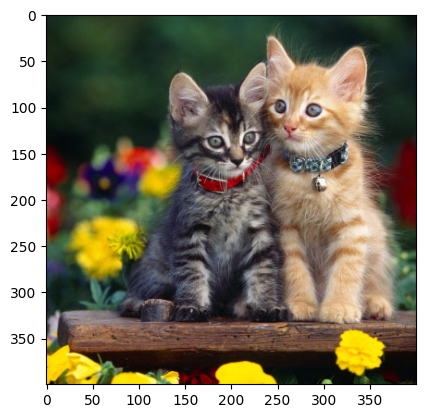

In [8]:
plt.imshow(img_1[:, :, ::-1]);

In [11]:
cv2.imshow(winname='Cats', mat=img_1)  # open image in other window, if waitKey is written
cv2.waitKey(0)  # 1000 = 1 sec, if 0 -> forever
cv2.destroyAllWindows()  # for closing window

## Read and show video

In [12]:
cap = cv2.VideoCapture(r'C:\Users\user\Desktop\main_project\DS\OpenCV\Nature1.mp4')
cap

< cv2.VideoCapture 000002CE7D4C53F0>

In [15]:
cap = cv2.VideoCapture(r'C:\Users\user\Desktop\main_project\DS\OpenCV\Nature1.mp4')

while True:
    success, img = cap.read()  # success is True, if we read picture, or False
    
    # if not success:
    #     break
    
    cv2.imshow(winname='Video', mat=img)

    if cv2.waitKey(25) & 0xFF == ord('q'):
        break
        
cap.release()
cv2.destroyAllWindows()

In [18]:
# Video with audio
import time
# ffpyplayer for playing audio
# ! pip install ffpyplayer
from ffpyplayer.player import MediaPlayer

def PlayVideo(video_path):
    player = MediaPlayer(video_path)
    time.sleep(0.5)
    video=cv2.VideoCapture(video_path)
    
    
    while True:
        grabbed, frame=video.read()
        audio_frame, val = player.get_frame()
        
        if not grabbed:
            print("End of video")
            break
            
        if cv2.waitKey(28) & 0xFF == ord("q"):
            break
            
        cv2.imshow("Video", frame)
        
        if val != 'eof' and audio_frame is not None:
            # audio
            img, t = audio_frame
            
    video.release()
    cv2.destroyAllWindows()

In [19]:
video_path = r'C:\Users\user\Desktop\main_project\DS\OpenCV\Nature1.mp4'
PlayVideo(video_path)

### Open and read camera

In [20]:
cap = cv2.VideoCapture(0)
cap.set(3, 1920)
cap.set(4, 1080)

while True:
    success, img = cap.read()  # success is True, if we read picture, or False
    
    if not success:
        break
    
    cv2.imshow(winname='Video', mat=img)

    if cv2.waitKey(20) & 0xFF == ord('q'):
        break

cap.release()  # close camera
cv2.destroyAllWindows()

In [21]:
cap = cv2.VideoCapture(0)
 
while(True):
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    cv2.imshow('frame', gray)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    
cap.release()  # close camera
cv2.destroyAllWindows()  # close window

In [12]:
# record video

cap = cv2.VideoCapture(0)
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('output.mp4', fourcc, 20.0, (640, 480))

while(True):
    ret, frame = cap.read()
#     gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    out.write(frame)
    cv2.imshow('frame', frame)#gray)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
out.release()
cv2.destroyAllWindows()

## BGR to RGB

In [14]:
img = cv2.imread(r'C:\Users\Admin\user\main_project\DS\OpenCV\cats.jpg')

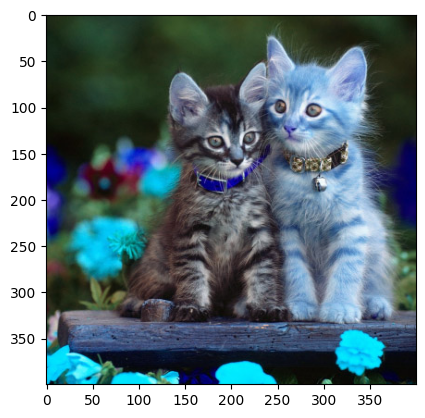

In [15]:
plt.imshow(img);

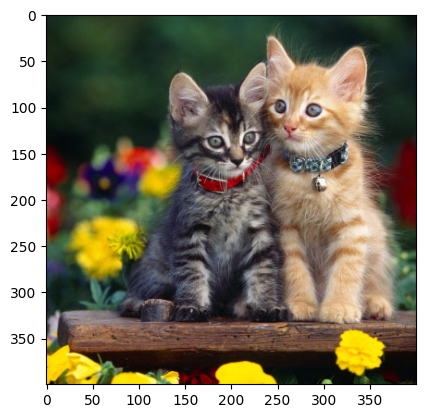

In [16]:
plt.imshow(img[:, :, ::-1]);

In [17]:
b, g, r = cv2.split(img)

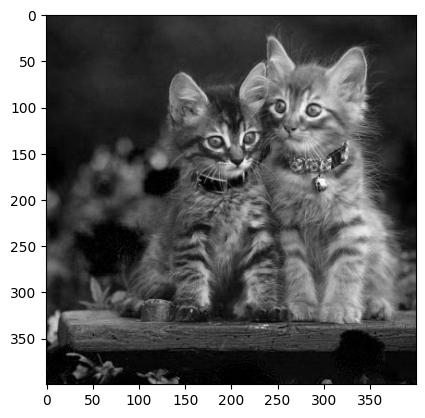

In [18]:
plt.imshow(b, cmap='gray');

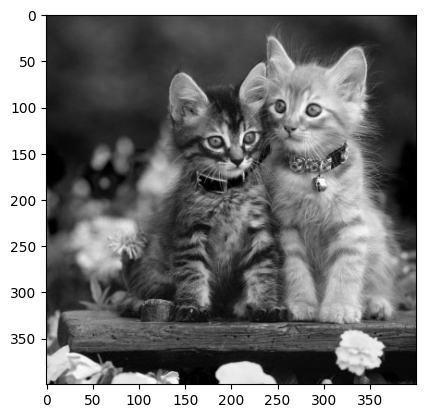

In [19]:
plt.imshow(g, cmap='gray');

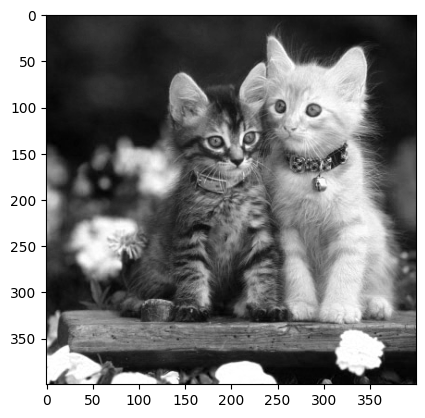

In [20]:
plt.imshow(r, cmap='gray');

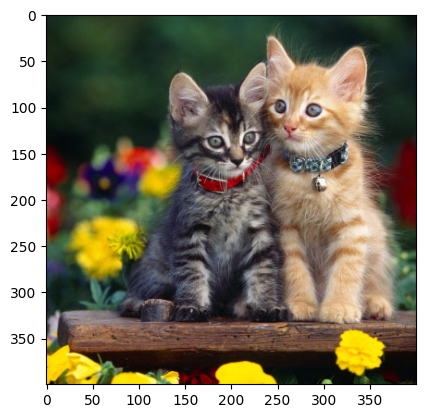

In [21]:
new_img = cv2.merge([r, g, b])
plt.imshow(new_img);

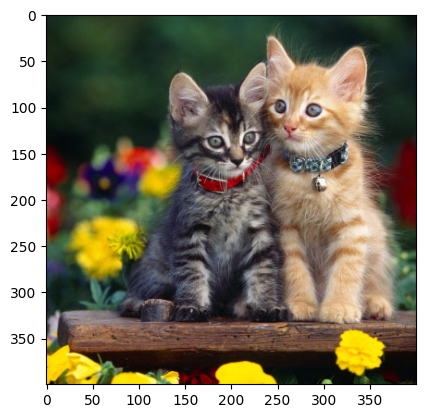

In [22]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb);

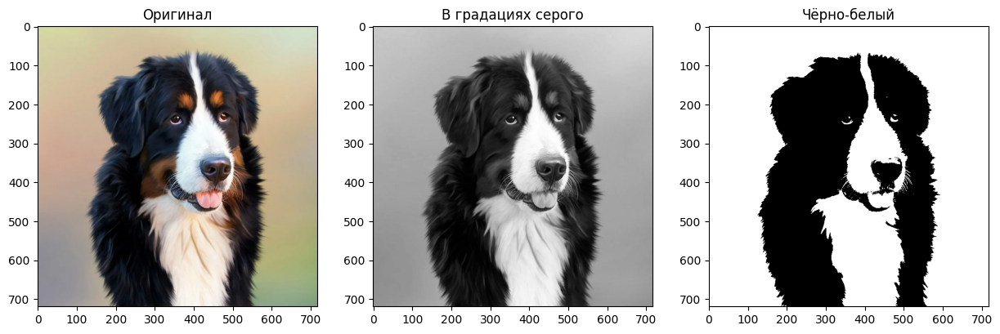

In [15]:
img_11 = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\dog.jpg')
img_rgb = cv2.cvtColor(img_11, cv2.COLOR_BGR2RGB)

gray_image = cv2.cvtColor(img_11, cv2.COLOR_RGB2GRAY)
ret, threshold_image = cv2.threshold(gray_image, 127, 255, 0)
# Здесь всё, что темнее, чем 127, заменяется на 0, а всё, что ярче, — на 255.

fig = plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.title("Оригинал")
plt.imshow(img_rgb)

plt.subplot(132)
plt.title("В градациях серого")
plt.imshow(gray_image, cmap="gray")

plt.subplot(133)
plt.title("Чёрно-белый")
plt.imshow(threshold_image, cmap="gray");

### Resize image

In [3]:
img_2 = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\tatev.jpg')
img_2.shape

(821, 1232, 3)

In [4]:
cv2.imshow('Tatev', img_2)
cv2.waitKey(0)

-1

In [5]:
# Reduce the size of the picture
new_1_img_2 = cv2.resize(img_2, (400, 500))
new_1_img_2.shape

(500, 400, 3)

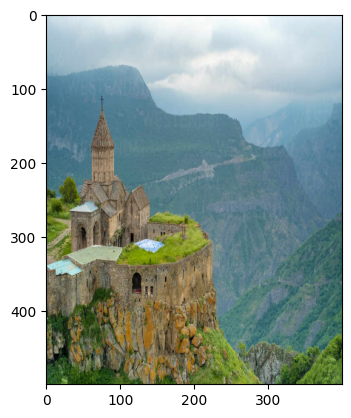

In [6]:
plt.imshow(new_1_img_2[:, :, ::-1]);

(1080, 1920, 3)


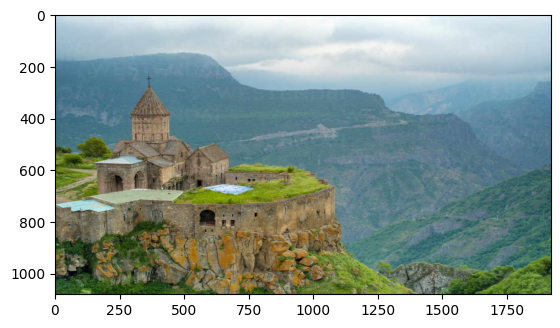

In [7]:
# Increase the size of the picture
new_2_img_2 = cv2.resize(img_2, (1920, 1080))
print(new_2_img_2.shape)

plt.imshow(new_2_img_2[:, :, ::-1]);

(410, 616, 3)


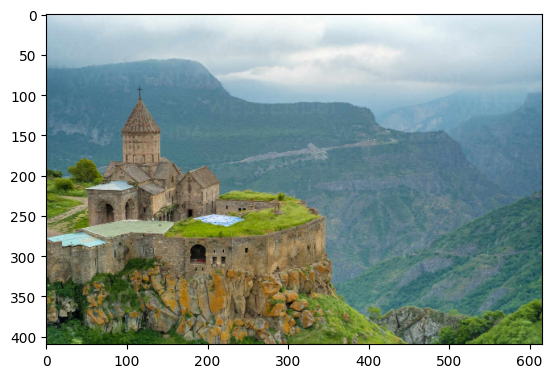

In [8]:
# Reduce the size of the picture 2 times
new_3_img_2 = cv2.resize(img_2, (img_2.shape[1] // 2, img_2.shape[0] // 2))
print(new_3_img_2.shape)

plt.imshow(new_3_img_2[:, :, ::-1]);

<b>Интерполяция</b> — это алгоритм, который находит неизвестные промежуточные значения по имеющемуся набору известных значений. Фактически, это то, как будут заполняться новые пиксели при модификации размера изображения. К примеру, интерполяция методом ближайшего соседа <b><code>(cv2.INTER_NEAREST)</code></b> просто берёт для каждого пикселя итогового изображения один пиксель исходного, который наиболее близкий к его положению — это самый простой и быстрый способ. Кроме этого метода в opencv существуют следующие: <b><code>cv2.INTER_AREA</code></b>, <b><code>cv2.INTER_LINEAR</code></b>( используется <i>по умолчанию</i>), <b><code>cv2.INTER_CUBIC</code></b> и <b><code>cv2.INTER_LANCZOS4</code></b>. Наиболее предпочтительным методом интерполяции для сжатия изображения является <b><code>cv2.INTER_AREA</code></b>, для увелечения — <b><code>cv2.INTER_LINEAR</code></b>. От данного метода зависит качество конечного изображения, но как показывает практика, если мы уменьшаем/увеличиваем изображение меньше, чем в 1.5 раза, то не важно каким методом интерполяции мы воспользовались — качество будет схожим.

In [10]:
img = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\anna.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)

(636, 599, 3)


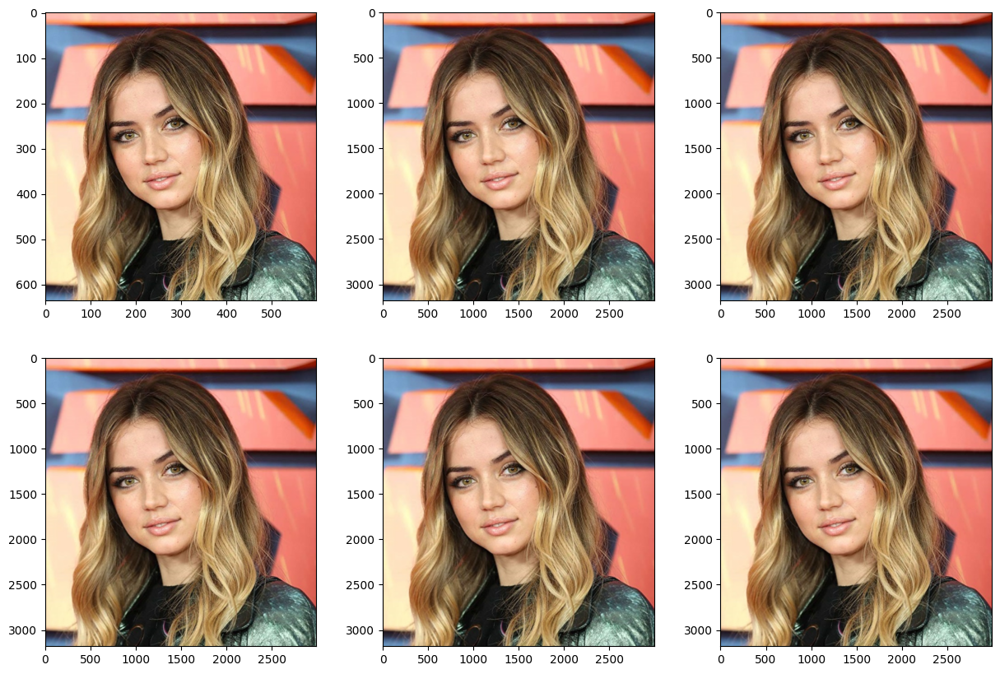

In [11]:
w, h = img.shape[1::-1]
w_x, h_x = 5, 5
res_img_nearest = cv2.resize(img, (int(w * w_x), int(h * h_x)), cv2.INTER_NEAREST)
res_img_linear = cv2.resize(img, (int(w * w_x), int(h * h_x)), cv2.INTER_LINEAR)
res_img_area = cv2.resize(img, (int(w * w_x), int(h * h_x)), cv2.INTER_AREA)
res_img_lanzos4 = cv2.resize(img, (int(w * w_x), int(h * h_x)), cv2.INTER_LANCZOS4)
res_img_cubic = cv2.resize(img, (int(w * w_x), int(h * h_x)), cv2.INTER_CUBIC)

fig, ax = plt.subplots(2, 3)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(img)
ax[0, 1].imshow(res_img_nearest)
ax[0, 2].imshow(res_img_linear)
ax[1, 0].imshow(res_img_area)
ax[1, 1].imshow(res_img_lanzos4)
ax[1, 2].imshow(res_img_cubic);

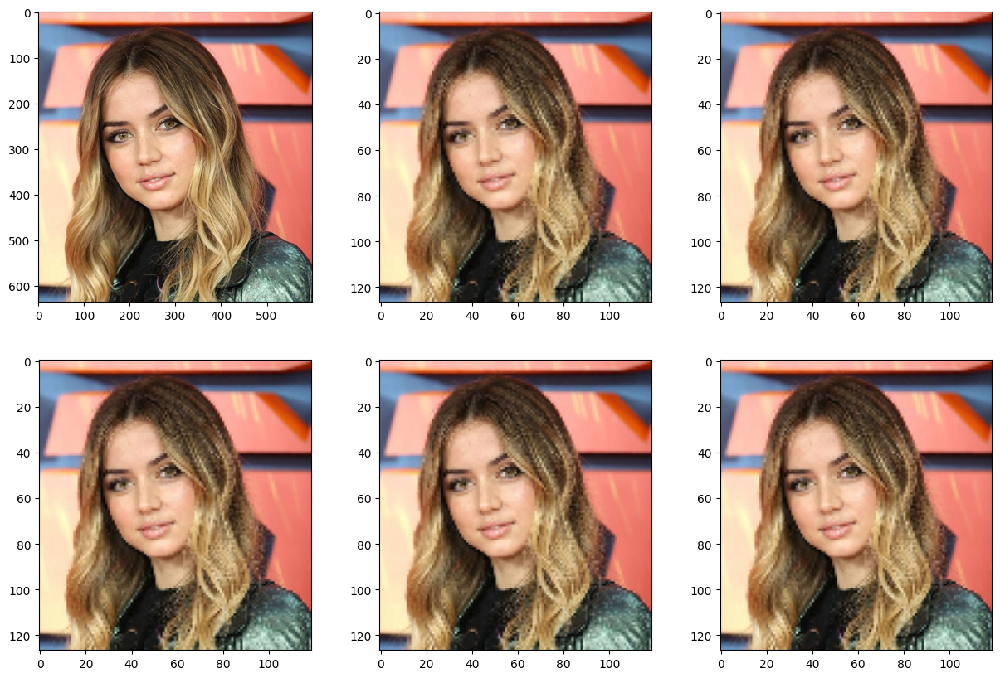

In [12]:
w, h = img.shape[1::-1]
w_x, h_x = 5, 5
res_img_nearest = cv2.resize(img, (int(w / w_x), int(h / h_x)), cv2.INTER_NEAREST)
res_img_linear = cv2.resize(img, (int(w / w_x), int(h / h_x)), cv2.INTER_LINEAR)
res_img_area = cv2.resize(img, (int(w / w_x), int(h / h_x)), cv2.INTER_AREA)
res_img_lanzos4 = cv2.resize(img, (int(w / w_x), int(h / h_x)), cv2.INTER_LANCZOS4)
res_img_cubic = cv2.resize(img, (int(w / w_x), int(h / h_x)), cv2.INTER_CUBIC)

fig, ax = plt.subplots(2, 3)
fig.set_size_inches(15, 10)
ax[0, 0].imshow(img)
ax[0, 1].imshow(res_img_nearest)
ax[0, 2].imshow(res_img_linear)
ax[1, 0].imshow(res_img_area)
ax[1, 1].imshow(res_img_lanzos4)
ax[1, 2].imshow(res_img_cubic);

### Crop picture

(821, 1232, 3)
(500, 1000, 3)


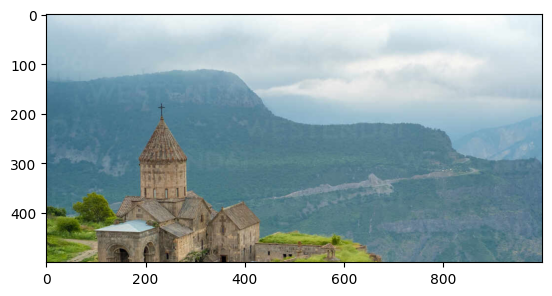

In [13]:
print(img_2.shape)

new_4_img_2 = img_2[0:500, 0:1000]
print(new_4_img_2.shape)

plt.imshow(new_4_img_2[:, :, ::-1]);

### Image blur

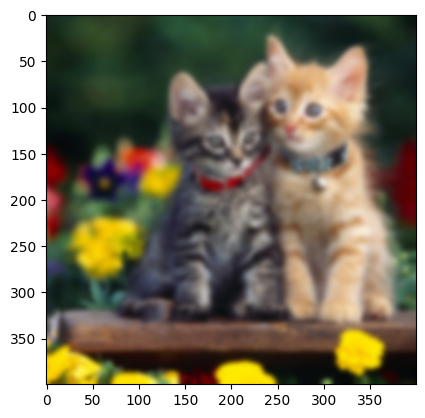

In [18]:
# kernel_size must be tuple of odd numbers
# if sigmaX is greate blur is greate, 0 is optimal, <1 week blur, >1 strong blur

new_1_img_1 = cv2.GaussianBlur(img_1, (15, 15), 0)

plt.imshow(new_1_img_1[:, :, ::-1]);

### Convert picture to graystyle

(400, 400)


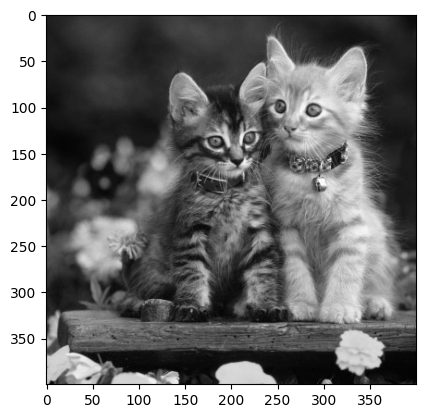

In [19]:
new_2_img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
print(new_2_img_1.shape)

plt.imshow(new_2_img_1[:, :], cmap='gray');

### Image outlines (Canny)

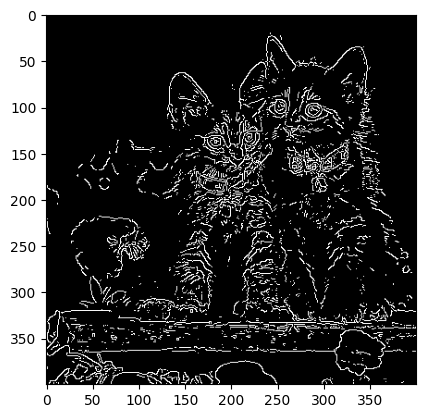

In [20]:
new_3_img_1 = cv2.Canny(img_1, threshold1=180, threshold2=180)  # 0 or 255
# if threshold1=150, all pixels <150 will become 0, if threshold2=150, all pixels >150 will become 255

"""https://ru.stackoverflow.com/questions/527548/%D0%94%D0%B5%D1%82%D0%B5%D0%BA%D1%82%D0%BE%D1%80-%D0%B3%D1%80%D0%B0%D0%BD%D0%B8%D1%86-%D0%9A%D0%B5%D0%BD%D0%BD%D0%B8-canny-edge-threshold-kernel-size"""

plt.imshow(new_3_img_1[:, :], cmap='gray');

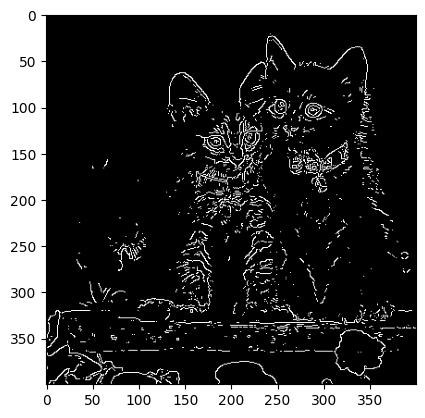

In [21]:
new_4_img_1 = cv2.Canny(new_2_img_1, 200, 200)

plt.imshow(new_4_img_1[:, :], cmap='gray');

### Изменение обводки / stroke change

In [22]:
kernel = np.ones((5, 5), np.uint8)
kernel

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

(400, 400, 3)


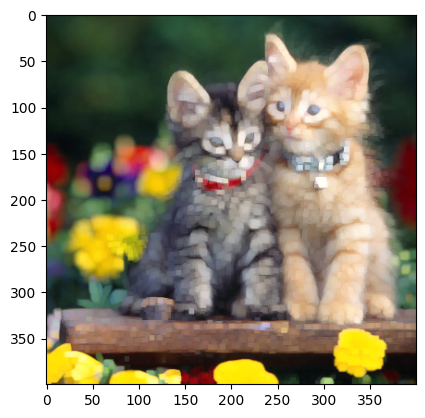

In [23]:
new_5_img_1 = cv2.dilate(img_1, kernel, iterations=1)
print(new_5_img_1.shape)

plt.imshow(new_5_img_1[:, :, ::-1]);

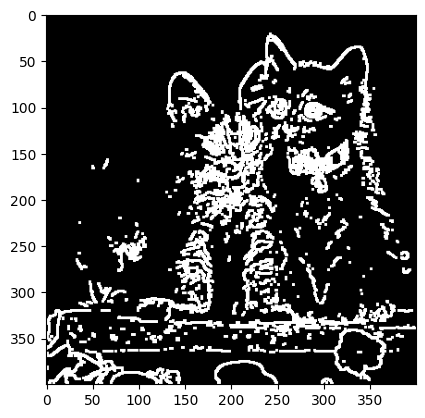

In [24]:
new_5_img_1 = cv2.dilate(new_4_img_1, np.ones((3, 3), np.uint8), iterations=1)

plt.imshow(new_5_img_1[:, :], cmap='gray');

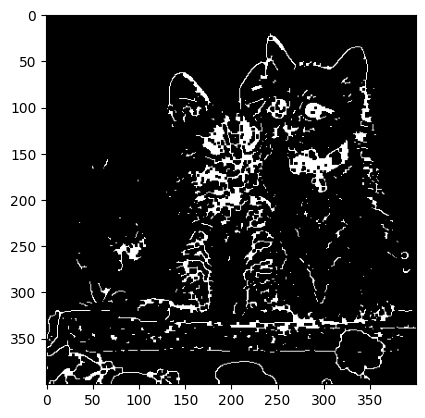

In [25]:
new_6_img_1 = cv2.erode(new_5_img_1, np.ones((3, 3), np.uint8), iterations=1)

plt.imshow(new_6_img_1[:, :], cmap='gray');

## Create photo

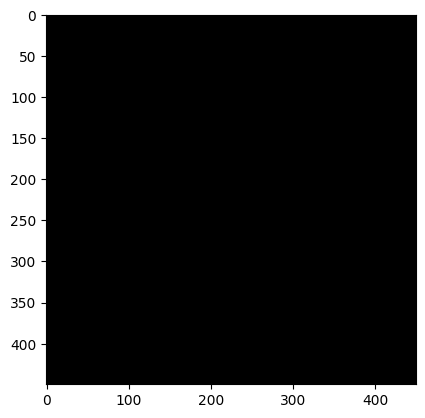

In [26]:
photo = np.zeros((450, 450, 3), dtype='uint8')

plt.imshow(photo);

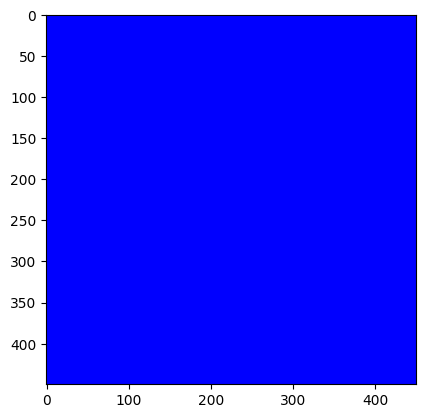

In [27]:
# RGB - стандарт (например в matplotlib)
# BGR - формат в OpenCV
photo[:] = 255, 0, 0

plt.imshow(photo[:, :, ::-1]);

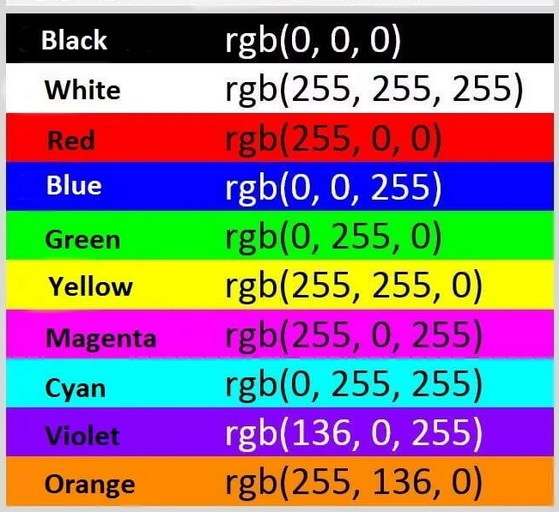

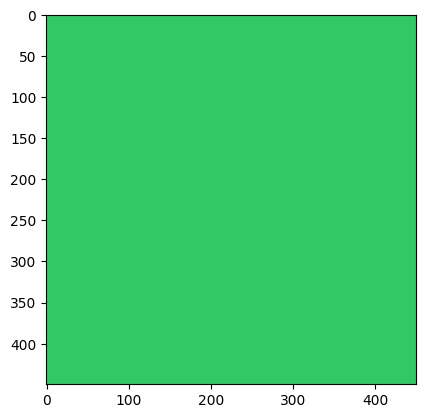

In [28]:
photo[:] = 100, 200, 50

plt.imshow(photo[:, :, ::-1]);

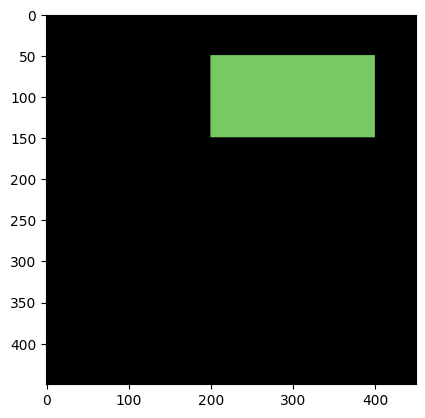

In [29]:
photo = np.zeros((450, 450, 3), dtype='uint8')
photo[50:150, 200:400, :] = 100, 200, 120

plt.imshow(photo[:, :, ::-1]);

### Draw rectangle

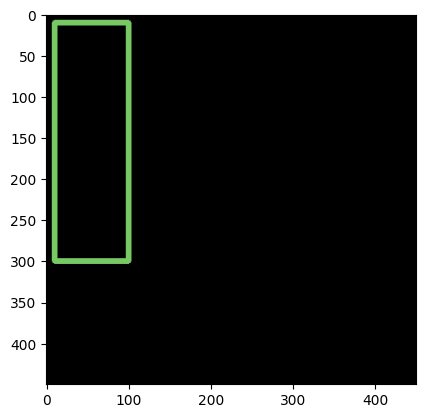

In [30]:
photo = np.zeros((450, 450, 3), dtype='uint8')

cv2.rectangle(photo, pt1=(10, 10), pt2=(100, 300), color=(100, 200, 120), thickness=5)  # thickness=cv2.FILLED - filled rectangle

plt.imshow(photo[:, :, ::-1]);

### Draw line

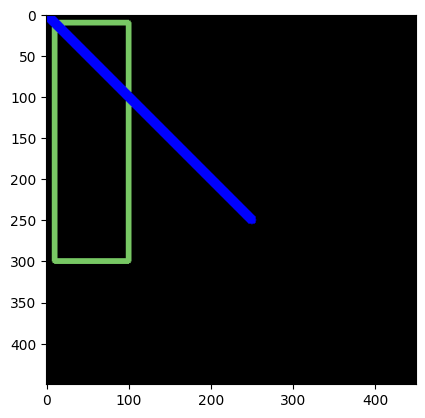

In [31]:
cv2.line(photo, pt1=(0, 0), pt2=(250, 250), color=(255, 0, 0), thickness=10)

plt.imshow(photo[:, :, ::-1]);

### Draw circle

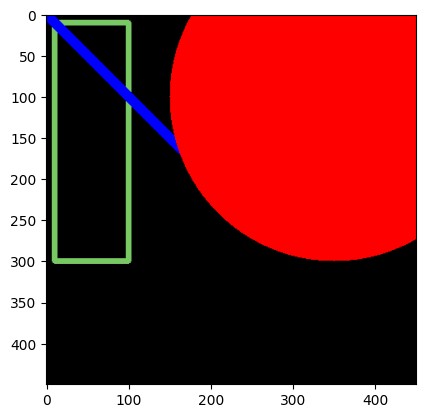

In [32]:
cv2.circle(photo, center=(350, 100), radius=200, color=(0, 0, 255), thickness=cv2.FILLED)

plt.imshow(photo[:, :, ::-1]);

### Put text

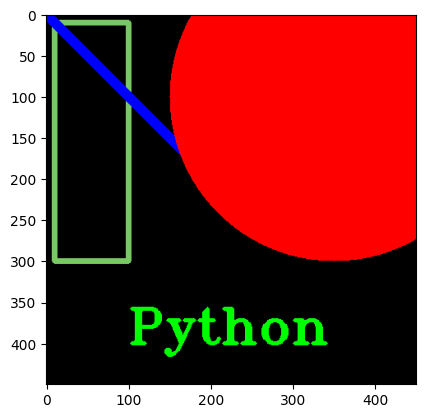

In [33]:
cv2.putText(photo, text='Python', org=(100, 400), fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=2, color=(0, 255, 0), thickness=3)

plt.imshow(photo[:, :, ::-1]);

## Change image

### Flip

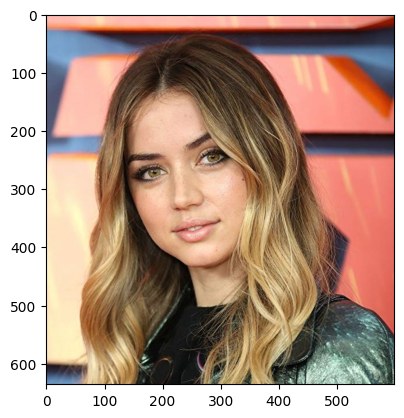

In [22]:
img = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\anna.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img);

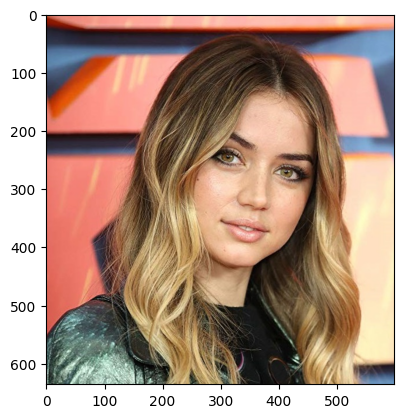

In [23]:
img_1 = cv2.flip(img, 1)  # (0) - flip_vertically, (1) - flip_horizontally, (-1) - flip_vert_horiz

plt.imshow(img_1);

### Rotate

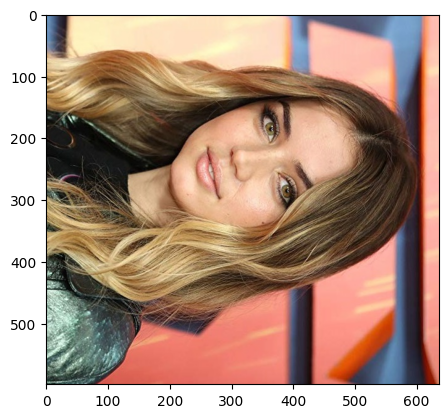

In [37]:
img_2 = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)

plt.imshow(img_2);

In [38]:
def rotate(img_param, angle):
    height, width = img.shape[:2]
    point = (width // 2, height // 2)  # точка вращения
    
    mat = cv2.getRotationMatrix2D(center=point, angle=angle, scale=1.2)  # scale - насколько раз увеличить изображение
    return cv2.warpAffine(img_param, M=mat, dsize=(height, width))

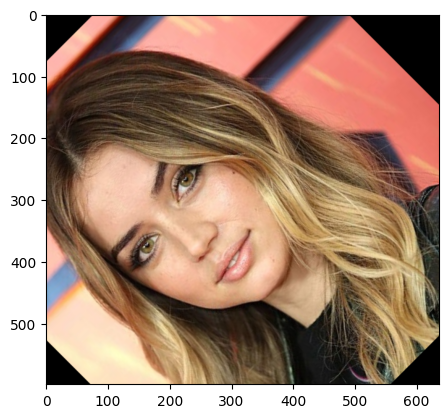

In [39]:
img_2_2 = rotate(img, 45)
plt.imshow(img_2_2);

### Shift

In [40]:
def transform(img_param, x, y):
    mat = np.float32([[1, 0, x], [0, 1, y]])
    return cv2.warpAffine(img_param, mat, (img_param.shape[1], img_param.shape[0]))

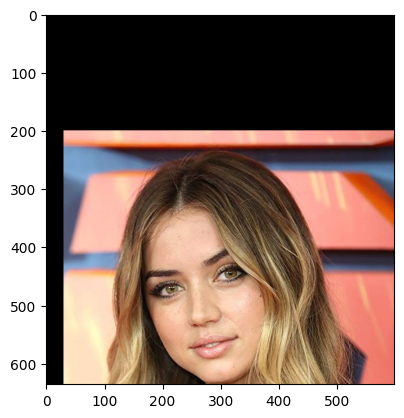

In [41]:
img_3 = transform(img, 30, 200)

plt.imshow(img_3);

## Bitwise operations

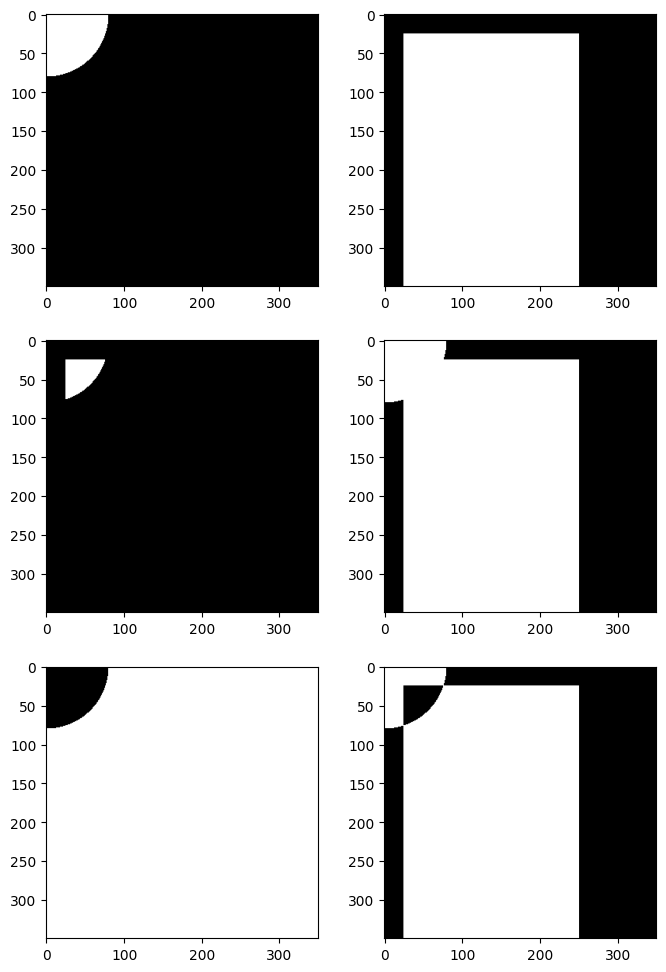

In [42]:
img = np.zeros((350, 350), dtype='uint8')

circle = cv2.circle(img.copy(), center=(0, 0), radius=80, color=255, thickness=-1)
square = cv2.rectangle(img.copy(), pt1=(25, 25), pt2=(250, 350), color = 255, thickness=-1)

img_1 = cv2.bitwise_and(src1=circle, src2=square)
img_2 = cv2.bitwise_or(circle, square)
img_3 = cv2.bitwise_not(circle)
img_4 = cv2.bitwise_xor(circle, square)

fig, ax = plt.subplots(3, 2)
fig.set_size_inches(8, 12)
ax[0, 0].imshow(circle, cmap='gray')
ax[0, 1].imshow(square, cmap='gray')
ax[1, 0].imshow(img_1, cmap='gray')
ax[1, 1].imshow(img_2, cmap='gray')
ax[2, 0].imshow(img_3, cmap='gray')
ax[2, 1].imshow(img_4, cmap='gray');

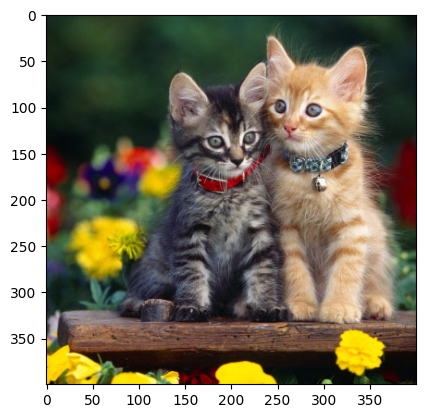

In [44]:
img = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\cats.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img);

In [45]:
img_ = np.zeros(img.shape[:2], dtype='uint8')

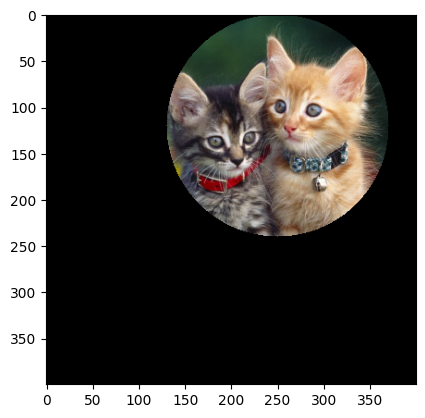

In [46]:
circle_ = cv2.circle(img_.copy(), center=(250, 120), radius=120, color=255, thickness=-1)

new_img_1 = cv2.bitwise_and(img, img, mask=circle_)
plt.imshow(new_img_1);

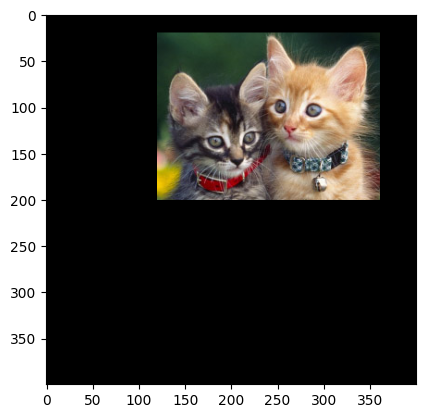

In [47]:
square_ = cv2.rectangle(img_.copy(), pt1=(120, 20), pt2=(360, 200), color = 255, thickness=-1)

new_img_2 = cv2.bitwise_and(img, img, mask=square_)
plt.imshow(new_img_2);

# Face detection

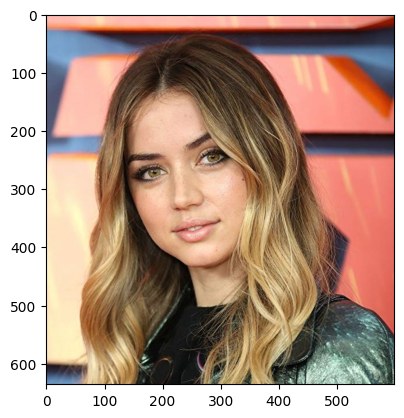

In [48]:
img = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\anna.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img);

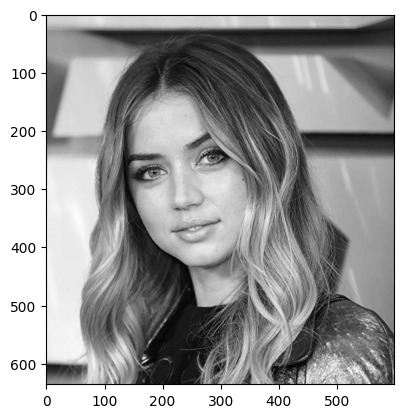

In [49]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(img_gray, cmap='gray');

### Read model weights

In [50]:
faces = cv2.CascadeClassifier(r'C:\Users\user\Desktop\main_project\DS\OpenCV\haarcascade_frontalface_default.xml')
# other models in " https://github.com/opencv/opencv/tree/master/data/haarcascades "

### Make model

<b><code>detectMultiScale</code></b> — общая функция для распознавания как лиц, так и объектов. Чтобы функция искала именно лица, мы передаём ей соответствующий каскад.

Функция <code>detectMultiScale</code> принимает следующие параметры:

- Обрабатываемое изображение в градации серого.
- Параметр <i><b><code>scaleFactor</code></b></i>. Некоторые лица могут быть больше других, поскольку находятся ближе, чем остальные. Этот параметр компенсирует перспективу (>1).
- Алгоритм распознавания использует скользящее окно во время распознавания объектов. Параметр <i><b><code>minNeighbors</code></b></i> определяет количество объектов вокруг лица. То есть чем больше значение этого параметра, тем больше аналогичных объектов необходимо алгоритму, чтобы он определил текущий объект, как лицо. Слишком маленькое значение увеличит количество ложных срабатываний, а слишком большое сделает алгоритм более требовательным.
- <i><b><code>minSize</code></b></i> — минимальный размер этих областей.
- <i><b><code>maxSize</code></b></i> — максималбный размер этих областей.

In [51]:
results = faces.detectMultiScale(img_gray, scaleFactor=1.5, minNeighbors=3, minSize=(10, 10), maxSize=(500, 500))

results

array([[100, 156, 273, 273]])

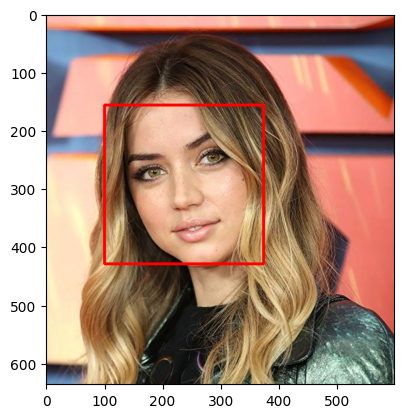

In [52]:
new_img = img.copy()

for x, y, w, h in results:
    cv2.rectangle(new_img, (x, y), (x + w, y + h), (255, 0, 0), thickness=3)

plt.imshow(new_img);

In [53]:
np.array([750, 1000]) / 1.5

array([500.        , 666.66666667])

(1956, 1536, 3)
(1000, 750, 3)


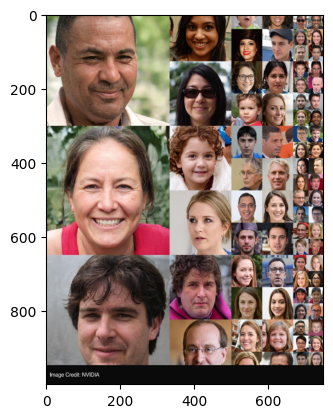

In [55]:
img_1 = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\faces.jpg')
print(img_1.shape)

img_1 = cv2.resize(img_1, (750, 1000))
print(img_1.shape)

plt.imshow(img_1[:, :, ::-1]);
img_gray_1 = cv2.cvtColor(img_1, cv2.COLOR_RGB2GRAY)

In [56]:
results_1 = faces.detectMultiScale(img_gray_1, scaleFactor=1.1, minNeighbors=2)

results_1[:5], results_1.shape

(array([[ 49, 733, 223, 223],
        [673, 922,  28,  28],
        [715, 922,  28,  28],
        [715,  93,  29,  29],
        [715,   6,  29,  29]]),
 (73, 4))

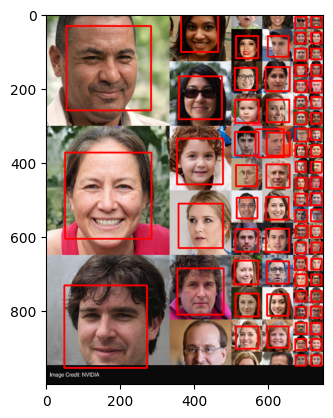

In [57]:
new_img_1 = img_1.copy()

for x, y, w, h in results_1:
    cv2.rectangle(new_img_1, (x, y), (x + w, y + h), (0, 0, 255), thickness=3)
    
plt.imshow(new_img_1[:, :, ::-1]);

In [58]:
cv2.imshow('Result_1', new_img_1)
cv2.waitKey(0)

-1

In [59]:
# save image
# cv2.imwrite('detected_faces.jpg', new_img_1)

(600, 500, 3)


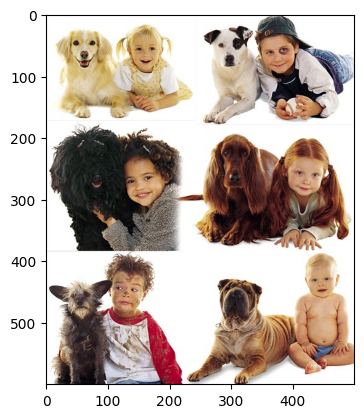

In [60]:
img_2 = cv2.imread(r'C:\Users\user\Desktop\main_project\DS\OpenCV\faces+.jpg')
print(img_2.shape)

plt.imshow(img_2[:, :, ::-1]);

img_gray_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

In [61]:
results_2 = faces.detectMultiScale(img_gray_2, scaleFactor=1.2, minNeighbors=2)

results_2[:5], results_2.shape

(array([[135,  35,  56,  56],
        [341,  35,  67,  67],
        [391, 235,  64,  64],
        [420, 410,  54,  54],
        [120, 240,  71,  71]]),
 (6, 4))

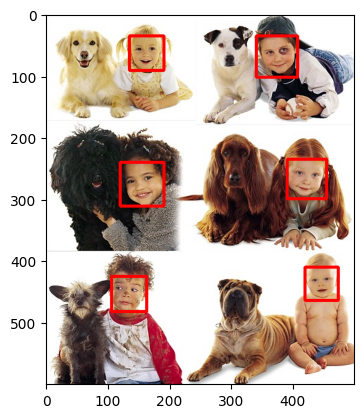

In [62]:
new_img_2 = img_2.copy()

for x, y, w, h in results_2:
    cv2.rectangle(new_img_2, (x, y), (x + w, y + h), (0, 0, 255), thickness=3)
    
plt.imshow(new_img_2[:, :, ::-1]);

In [63]:
cv2.imshow('Result_2', new_img_2)
cv2.waitKey(0)

-1

In [24]:
cap = cv2.VideoCapture(0)
cap.set(3, 1920)
cap.set(4, 1080)

while True:
    success, img = cap.read()  # success is True, if we read picture, or False
    
    if not success:
        break
    
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    faces = cv2.CascadeClassifier(r'C:\Users\user\Desktop\main_project\DS\OpenCV\haarcascade_frontalface_default.xml')
    results = faces.detectMultiScale(img_gray, scaleFactor=1.5, minNeighbors=3, minSize=(10, 10), maxSize=(500, 500))
    new_img = img.copy()

    for x, y, w, h in results:
        cv2.rectangle(new_img, (x, y), (x + w, y + h), (255, 0, 0), thickness=3)
    
    cv2.imshow(winname='Video', mat=new_img)

    if cv2.waitKey(20) & 0xFF == ord('q'):
        break

cap.release()  # close camera
cv2.destroyAllWindows()